In [35]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [36]:
from datasets import *
# source https://multibandtexture.recherche.usherbrooke.ca/original_brodatz.html
data = Dataset("datasets/Original Brodatz")
print(len(data.images))
imgs = data.ToNumpy()

112


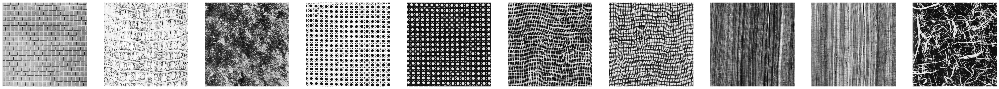

In [37]:
from vizutils import *

ImShowArray(imgs[:10])

# Histograms

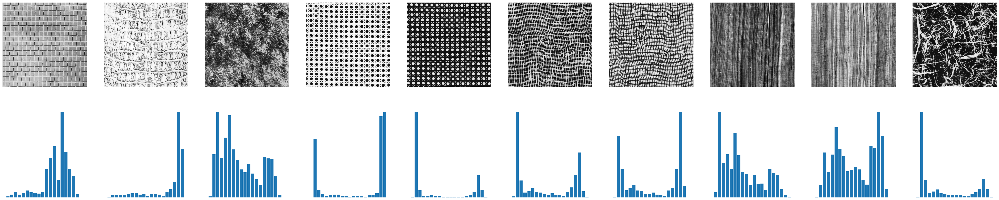

In [42]:
from computils import *
from skimage.filters import sobel, gaussian

def Histo(img, bins = 20):
    return np.histogram(img, bins=bins, density=True)[0]
res = Calc(imgs, Histo)
n = 10
ImShowArrayWithHistograms(imgs[:n],res[:n])

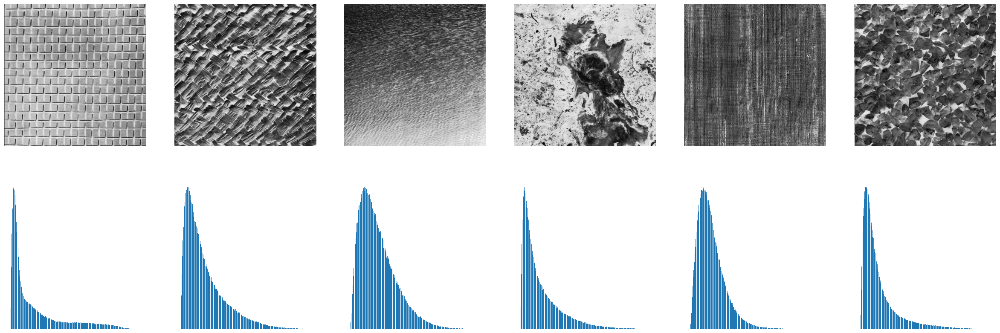

In [75]:
def HistogramsOfGradientMagnitus(img, sigma, bins = 16):
    if (sigma == None):
        g = sobel(img)
    else:
        g = sobel(gaussian(img,sigma))

    gx, gy = np.gradient(gaussian(img, sigma))
    gmag = np.sqrt(np.square(gx) + np.square(gy))
    return np.histogram(gmag, bins=bins)[0]
n = 5
stride = len(imgs)//n
res = Calc(imgs[::stride], lambda img: HistogramsOfGradientMagnitus(img, 1.0,255))
ImShowArrayWithHistograms(imgs[::stride],res)

== var == 


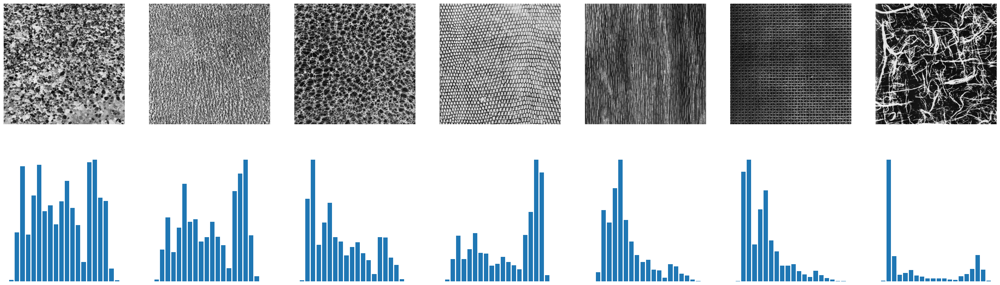

== skew == 


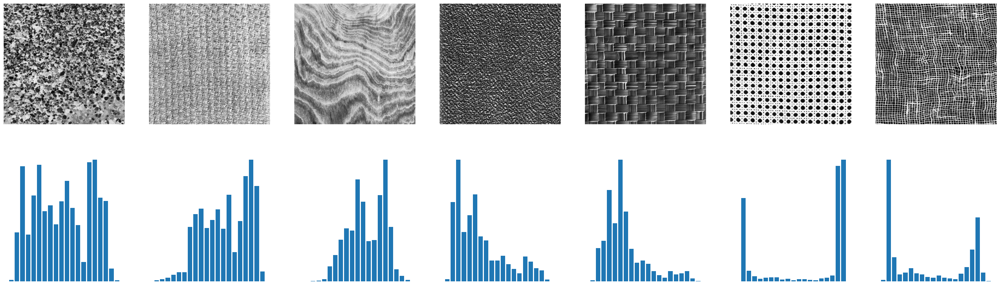

== kurtosis == 


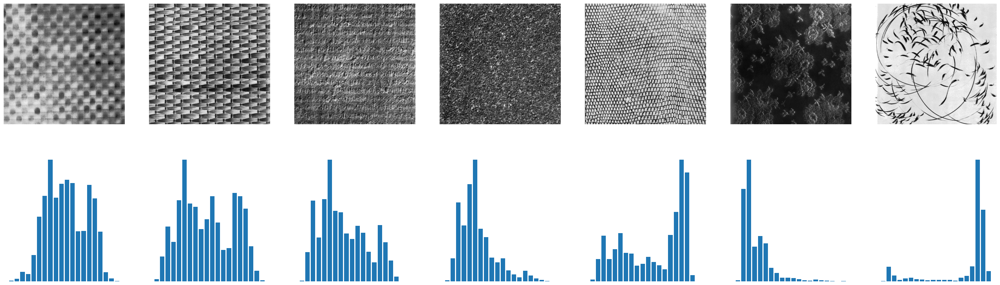

== entropy == 


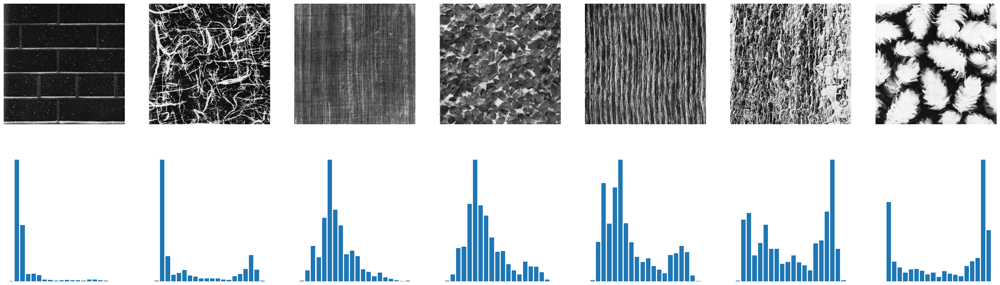

In [44]:
from scipy.stats import skew, kurtosis

def HistogramsFeatures(histogram):
    features = dict()
    features["var"] = np.var(histogram)
    features["skew"] = skew(histogram)
    features["kurtosis"] = kurtosis(histogram)
    features["entropy"] = -np.sum(histogram * np.log(histogram + 1e-10))
    return features

n = 7
stride = len(imgs)//n
res = Calc(imgs, lambda img: HistogramsFeatures(Histo(img)))
histograms = Calc(imgs, Histo)
print("== var == ")
SortAndShowWithHistograms(imgs,[e["var"] for e in res],n,histograms)
print("== skew == ")
SortAndShowWithHistograms(imgs,[e["skew"] for e in res],n,histograms)
print("== kurtosis == ")
SortAndShowWithHistograms(imgs,[e["kurtosis"] for e in res],n,histograms)
print("== entropy == ")
SortAndShowWithHistograms(imgs,[e["entropy"] for e in res],n,histograms)


## Segmentaion with histograms

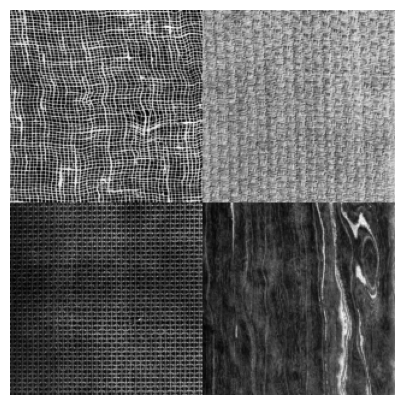

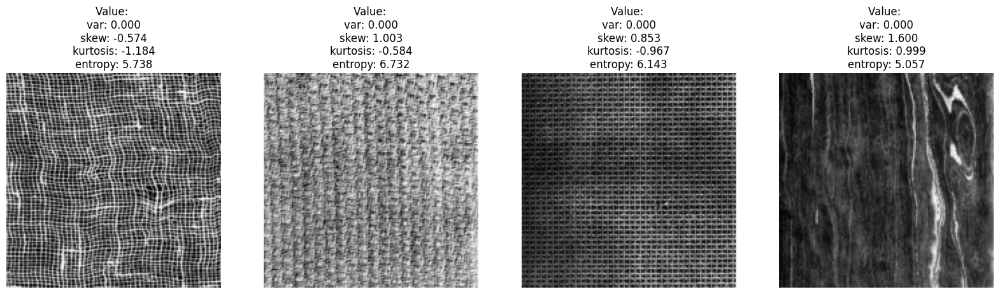

  0%|          | 0/305 [00:00<?, ?it/s]

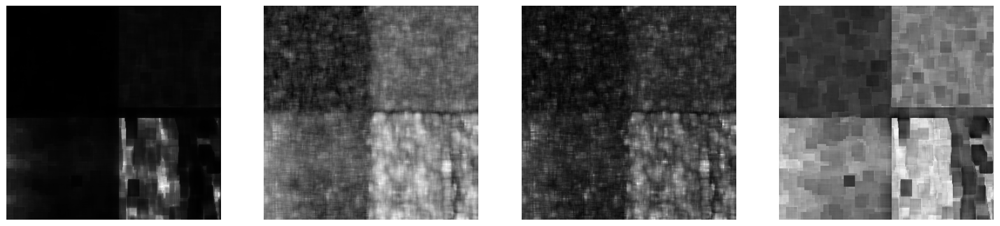

[[2. 2. 1. ... 3. 1. 3.]
 [2. 2. 1. ... 3. 1. 1.]
 [2. 2. 2. ... 3. 1. 3.]
 ...
 [3. 3. 3. ... 3. 3. 3.]
 [1. 1. 3. ... 3. 3. 3.]
 [1. 3. 3. ... 3. 3. 3.]]


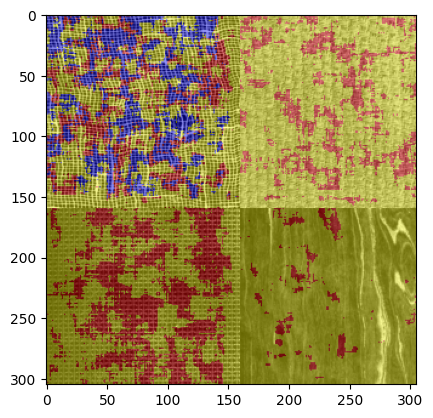

In [46]:
from skimage.transform import resize
from computils import *

test_imgs = [imgs[5],imgs[93],imgs[60],imgs[80]]
SegmentationExample(test_imgs, lambda img: HistogramsFeatures(Histo(img,255)),160,True)

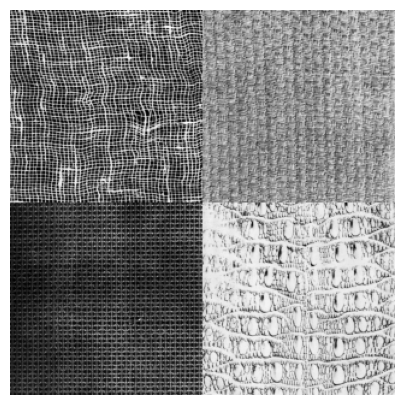

  0%|          | 0/289 [00:00<?, ?it/s]

[[0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 [0. 0. 0. ... 1. 1. 1.]
 ...
 [2. 2. 2. ... 3. 3. 3.]
 [2. 2. 2. ... 3. 3. 3.]
 [2. 2. 2. ... 3. 3. 3.]]


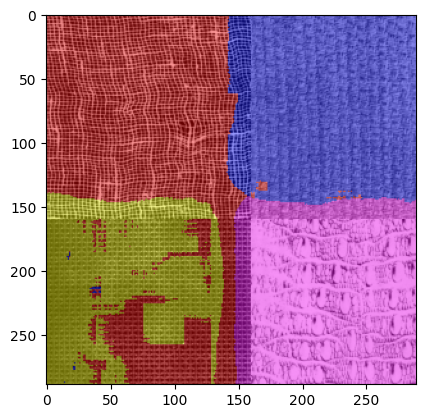

In [110]:
from computils import *
test_imgs = [imgs[5],imgs[93],imgs[60],imgs[1]]
SegmentationExampleVectorDescriptor(test_imgs, Histo, 160, window_size=32)

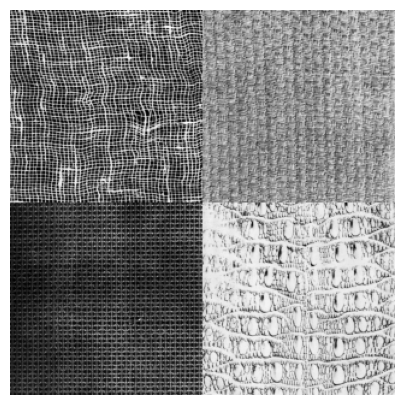

  0%|          | 0/289 [00:00<?, ?it/s]

[[2. 2. 2. ... 3. 1. 1.]
 [0. 0. 2. ... 3. 2. 2.]
 [0. 0. 0. ... 3. 1. 2.]
 ...
 [0. 0. 0. ... 1. 1. 1.]
 [2. 2. 2. ... 1. 1. 1.]
 [2. 2. 2. ... 2. 2. 3.]]


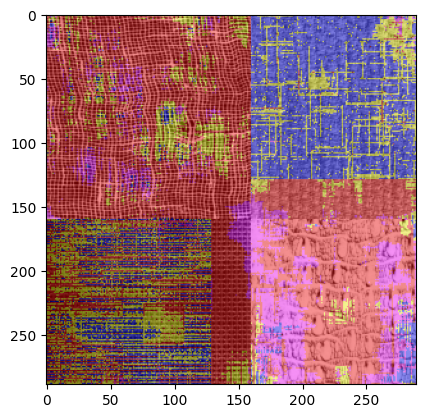

In [113]:
from computils import *
SegmentationExampleVectorDescriptor(test_imgs,lambda img: HistogramsOfGradientMagnitus(img,1,16), 160, False, True,window_size=32)